# Stock Data Visualization

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import plotly
import plotly.graph_objs as go
import chart_studio.plotly as py
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

In [2]:
stock_names=['AAPL','ADBE','ADP','AMAT','AMD','AMZN','AVGO','CRM','CSCO','EBAY','FB','GOOG','IBM','INTC','INTU','LRCX','MSFT','NFLX','NVDA','ORCL','PYPL','QCOM','TSLA','TWTR','TXN']

In [3]:
df = pd.read_csv('./stock_data.csv')

In [4]:
df.columns =['Date','Stock','High','Low','Open','Close','Volume']

In [5]:
df.shape

(65891, 7)

In [6]:
df.head()

,Date,Stock,High,Low,Open,Close,Volume
0,2011-01-04,AAPL,47.500000,46.878571,47.500000,47.327141,77337001.0
1,2011-01-05,AAPL,47.762856,47.071426,47.078571,47.714287,63879193.0
2,2011-01-06,AAPL,47.892857,47.557140,47.857143,47.675713,75106626.0
3,2011-01-07,AAPL,48.049999,47.414284,47.731426,48.017143,77982212.0
4,2011-01-10,AAPL,49.032856,48.167141,48.404285,48.922142,112139482.0


In [7]:
df.tail()

,Date,Stock,High,Low,Open,Close,Volume
65886,2021-12-07,TXN,199.860001,195.929993,196.399994,199.029999,5815641.0
65887,2021-12-08,TXN,198.500000,193.869995,198.500000,196.389999,4255930.0
65888,2021-12-09,TXN,196.899994,193.250000,195.570007,193.399994,3626664.0
65889,2021-12-10,TXN,196.360001,192.810898,196.020004,196.000000,3093286.0
65890,2021-12-13,TXN,196.714996,193.122604,196.100006,194.130005,2783797.0


In [8]:
dropdown = {'AAPL':'Apple','ADBE':'Adobe','ADP':'Automatic Data Processing','AMAT':'Applied Materials','AMD':'AMD','AMZN':'Amazon',
            'AVGO':'Broadcom','CRM':'Salesforce','CSCO':'Cisco','EBAY':'eBay','FB':'Facebook','GOOG':'Google',
           'IBM':'IBM','INTC':'Intel','INTU':'Intuit','LRCX':'Lam Research','MSFT':'Microsoft','NFLX':'Netflix','NVDA':'NVIDIA',
           'ORCL':'Oracle','PYPL':'PayPal','QCOM':'QUALCOMM','TSLA':'Tesla','TWTR':'Twitter','TXN':'Texas Instruments',}

## Static Visualization

### Close

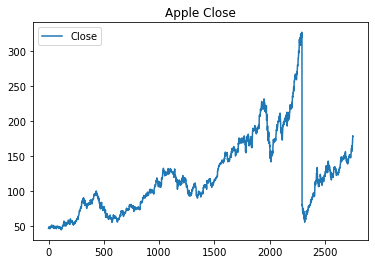

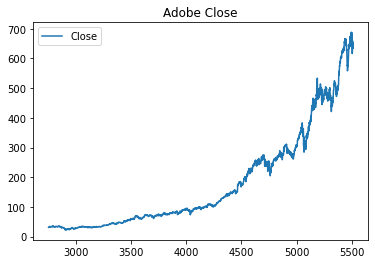

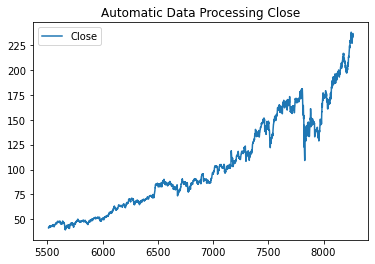

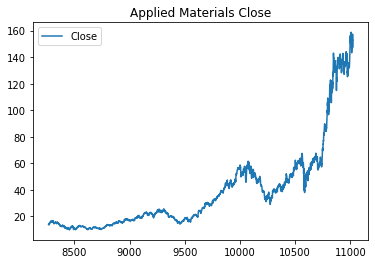

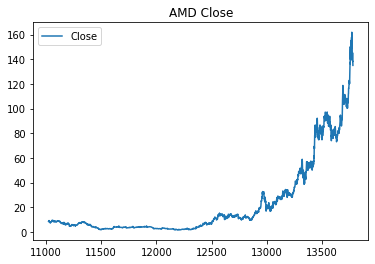

...

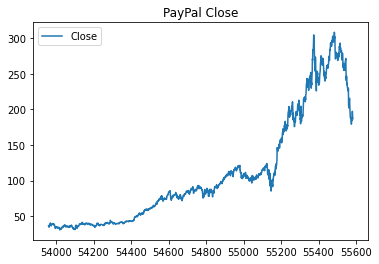

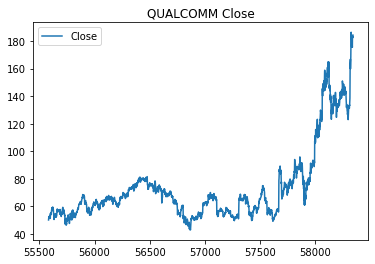

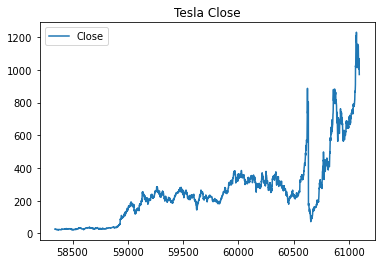

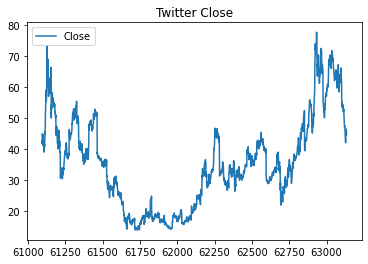

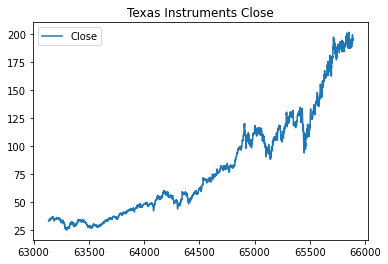

In [9]:
for stock in stock_names:
    df[df['Stock'] == stock][['Close']].plot()
    plt.title(dropdown[stock] + ' Close')
    plt.show()

### High

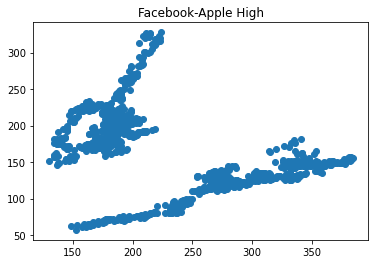

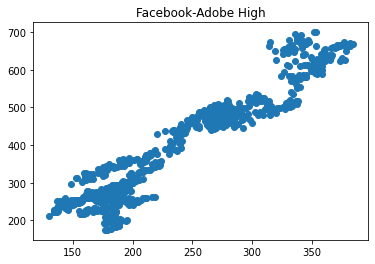

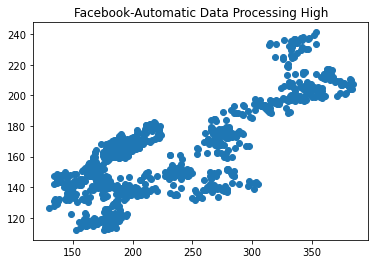

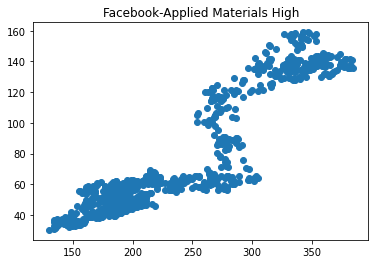

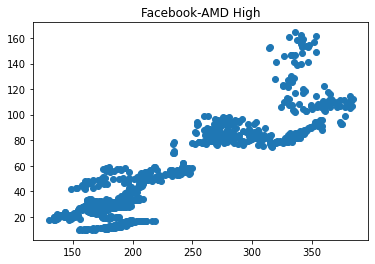

...

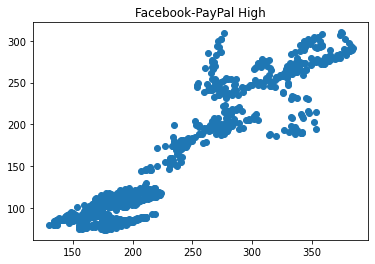

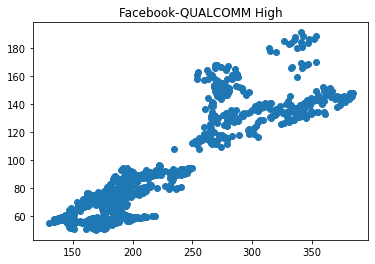

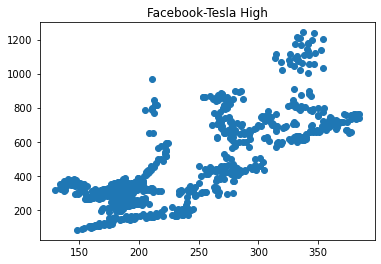

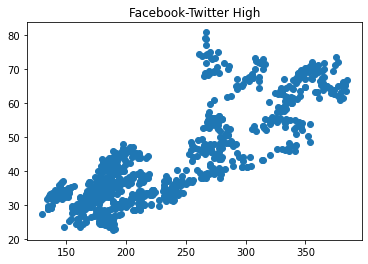

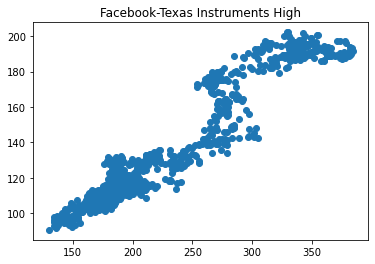

In [10]:
for i in range(len(stock_names)):
    plt.scatter(df[df['Stock'] == 'FB']['High'][-1000:], df[df['Stock'] == stock_names[i]]['High'][-1000:])
    plt.title('Facebook' + '-' + dropdown[stock_names[i]] + ' High')
    plt.show()

### Low

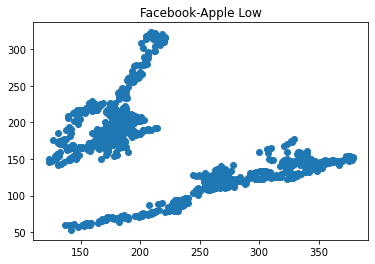

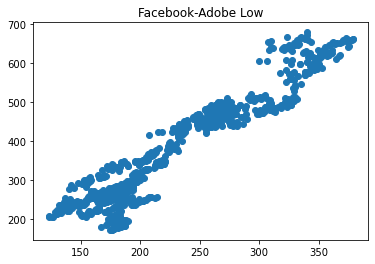

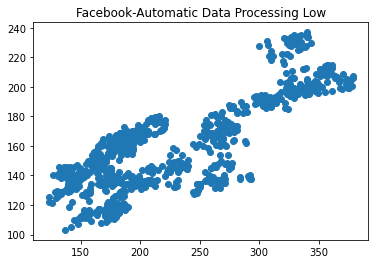

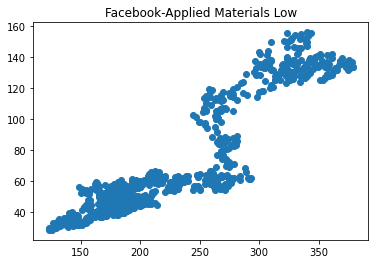

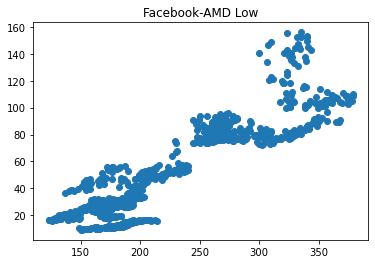

...

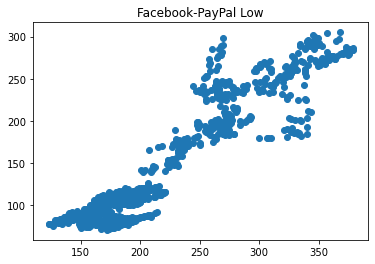

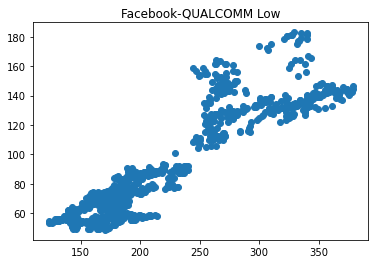

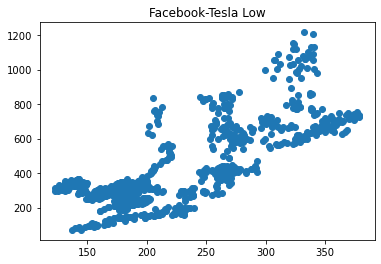

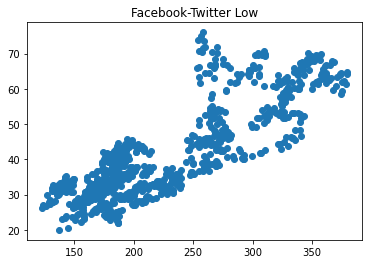

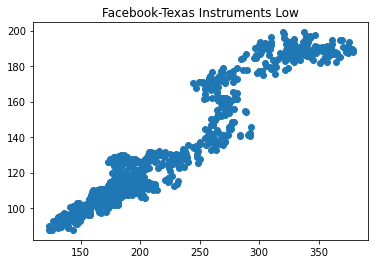

In [11]:
for i in range(len(stock_names)):
    plt.scatter(df[df['Stock'] == 'FB']['Low'][-1000:], df[df['Stock'] == stock_names[i]]['Low'][-1000:])
    plt.title('Facebook' + '-' + dropdown[stock_names[i]] + ' Low')
    plt.show()

### Volume

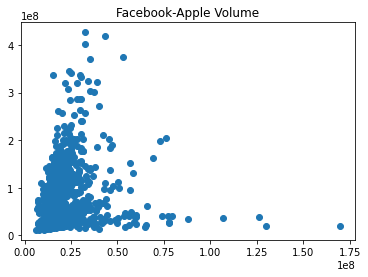

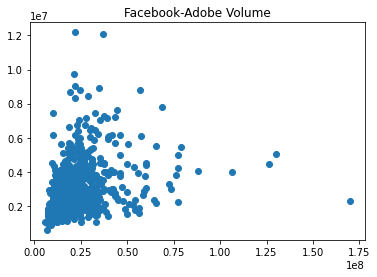

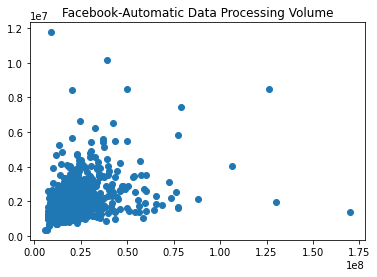

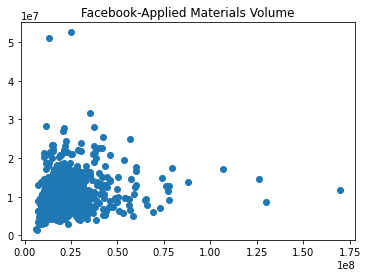

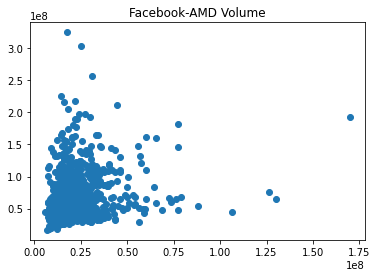

...

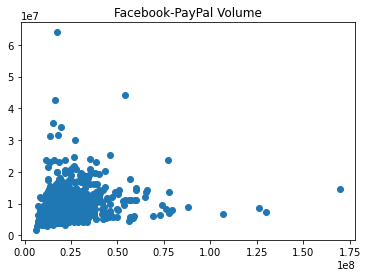

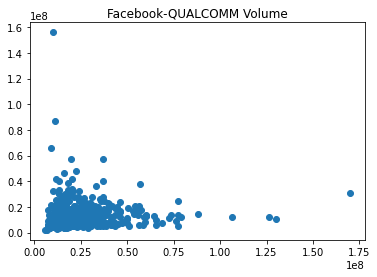

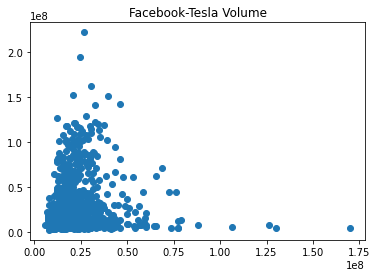

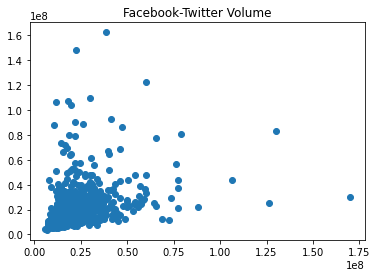

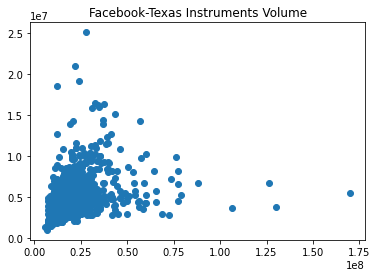

In [12]:
for i in range(len(stock_names)):
    plt.scatter(df[df['Stock'] == 'FB']['Volume'][-1000:], df[df['Stock'] == stock_names[i]]['Volume'][-1000:])
    plt.title('Facebook' + '-' + dropdown[stock_names[i]] + ' Volume')
    plt.show()

## Interactive Visualization

In [13]:
for stock in stock_names:
    trace_high = go.Scatter(
        x=df[df['Stock'] == stock].Date,
        y=df[df['Stock'] == stock]['High'],
        name = dropdown[stock] +' High',
        line = dict(color = '#17BECF'),
        opacity = 0.8)
    
    trace_low = go.Scatter(
        x=df[df['Stock'] == stock].Date,
        y=df[df['Stock'] == stock]['Low'],
        name = dropdown[stock] +' Low',
        line = dict(color = '#7F7F7F'),
        opacity = 0.8)
    
    data = [trace_high,trace_low]
    
    layout = dict(
        title='Time Series with Rangeslider',
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                         label='1m',
                         step='month',
                         stepmode='backward'),
                    dict(count=6,
                         label='6m',
                         step='month',
                         stepmode='backward'),
                    dict(step='all')
                    ])
                ),
            rangeslider=dict(
                visible = True
            ),
            type='date'
        ))
    
    fig = dict(data=data, layout=layout)
    iplot(fig, filename='Time Series with Rangeslider')